In [1]:
import sys
import pickle
import numpy as np
import pandas as pd
import torch

sys.path.append('..')
from src.utils import *
from src.models import *
from src.configs import *


from matplotlib import rcParams
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
rcParams.update(fig_params)

import warnings

%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

## Set device

In [2]:
DEVICE = 'cuda:2' if torch.cuda.is_available() else 'cpu'
print('Using device:', DEVICE)

Using device: cuda:2


## Load experiments file

In [3]:
FILENAME = 'Experiments_MASSIVE.xlsx'

In [4]:
exp_df = pd.read_excel(os.path.join('..', 'experiments', FILENAME), dtype=FORMAT)
exp_df.head()

,exp_id,seed,torch_dtype,samples_number,features_number,snr_db,informative_frac,folds_number,initialization,epochs_number,learning_rate
0,MASSIVE000,8925,64,1000,100,20,0.5,5,1.0,300,350.0
1,MASSIVE001,65459,64,1000,100,20,0.5,5,1.0,300,350.0
2,MASSIVE002,30300,64,1000,100,20,0.5,5,1.0,300,350.0
3,MASSIVE003,38747,64,1000,100,20,0.5,5,1.0,300,350.0
4,MASSIVE004,26932,64,1000,100,20,0.5,5,1.0,300,350.0


## Run experiments

In [6]:
exp_df = exp_df.iloc[:100].copy()
exp_df

,exp_id,seed,torch_dtype,samples_number,features_number,snr_db,informative_frac,folds_number,initialization,epochs_number,learning_rate
0,MASSIVE000,8925,64,1000,100,20,0.5,5,1.0,300,350.0
1,MASSIVE001,65459,64,1000,100,20,0.5,5,1.0,300,350.0
2,MASSIVE002,30300,64,1000,100,20,0.5,5,1.0,300,350.0
3,MASSIVE003,38747,64,1000,100,20,0.5,5,1.0,300,350.0
4,MASSIVE004,26932,64,1000,100,20,0.5,5,1.0,300,350.0
...,...,...,...,...,...,...,...,...,...,...,...
95,MASSIVE095,30644,64,1000,1000,20,0.5,5,1.0,300,350.0
96,MASSIVE096,80329,64,1000,1000,20,0.5,5,1.0,300,350.0
97,MASSIVE097,35153,64,1000,1000,20,0.5,5,1.0,300,350.0
98,MASSIVE098,96578,64,1000,1000,20,0.5,5,1.0,300,350.0


  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.745, Valid r2: 0.712, Test r2: 0.706, Train mse: 0.255, Valid mse: 0.289, Test mse: 0.310
Epoch 11: Train r2: 0.763, Valid r2: 0.725, Test r2: 0.732, Train mse: 0.237, Valid mse: 0.273, Test mse: 0.283
Epoch 21: Train r2: 0.908, Valid r2: 0.891, Test r2: 0.898, Train mse: 0.092, Valid mse: 0.109, Test mse: 0.107
Epoch 31: Train r2: 0.954, Valid r2: 0.946, Test r2: 0.950, Train mse: 0.046, Valid mse: 0.054, Test mse: 0.053
Epoch 41: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse: 0.011
Epoch 51: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse: 0.011
Epoch 61: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse: 0.011
Epoch 71: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse: 0.011
Epoch 81: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse:

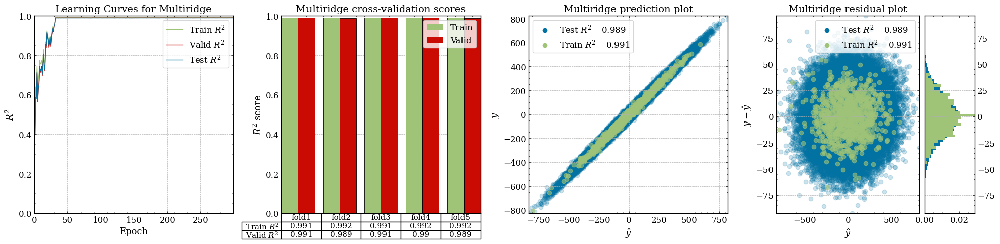

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.765, Valid r2: 0.729, Test r2: 0.743, Train mse: 0.235, Valid mse: 0.272, Test mse: 0.239
Epoch 11: Train r2: 0.857, Valid r2: 0.833, Test r2: 0.832, Train mse: 0.143, Valid mse: 0.166, Test mse: 0.156
Epoch 21: Train r2: 0.878, Valid r2: 0.858, Test r2: 0.862, Train mse: 0.122, Valid mse: 0.141, Test mse: 0.129
Epoch 31: Train r2: 0.935, Valid r2: 0.926, Test r2: 0.920, Train mse: 0.065, Valid mse: 0.074, Test mse: 0.074
Epoch 41: Train r2: 0.987, Valid r2: 0.984, Test r2: 0.983, Train mse: 0.013, Valid mse: 0.016, Test mse: 0.015
Epoch 51: Train r2: 0.992, Valid r2: 0.991, Test r2: 0.990, Train mse: 0.008, Valid mse: 0.009, Test mse: 0.010
Epoch 61: Train r2: 0.992, Valid r2: 0.991, Test r2: 0.990, Train mse: 0.008, Valid mse: 0.009, Test mse: 0.010
Epoch 71: Train r2: 0.992, Valid r2: 0.991, Test r2: 0.990, Train mse: 0.008, Valid mse: 0.009, Test mse: 0.010
Epoch 81: Train r2: 0.992, Valid r2: 0.991, Test r2: 0.990, Train mse: 0.008, Valid mse: 0.009, Test mse:

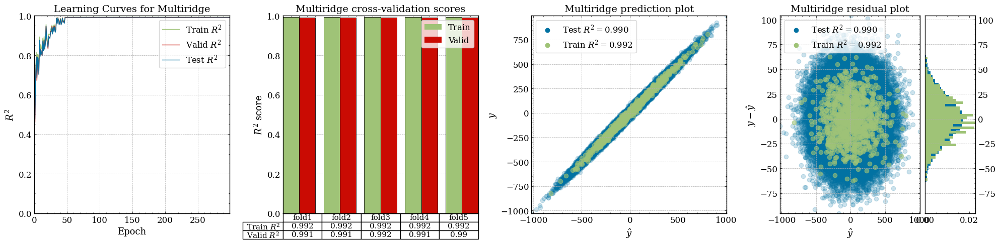

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.745, Valid r2: 0.707, Test r2: 0.713, Train mse: 0.255, Valid mse: 0.292, Test mse: 0.301
Epoch 11: Train r2: 0.831, Valid r2: 0.802, Test r2: 0.814, Train mse: 0.169, Valid mse: 0.194, Test mse: 0.195
Epoch 21: Train r2: 0.872, Valid r2: 0.849, Test r2: 0.856, Train mse: 0.128, Valid mse: 0.151, Test mse: 0.151
Epoch 31: Train r2: 0.976, Valid r2: 0.971, Test r2: 0.972, Train mse: 0.024, Valid mse: 0.029, Test mse: 0.029
Epoch 41: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.989, Train mse: 0.010, Valid mse: 0.012, Test mse: 0.011
Epoch 51: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.990, Train mse: 0.010, Valid mse: 0.012, Test mse: 0.011
Epoch 61: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.990, Train mse: 0.010, Valid mse: 0.011, Test mse: 0.011
Epoch 71: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.990, Train mse: 0.010, Valid mse: 0.012, Test mse: 0.011
Epoch 81: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.990, Train mse: 0.010, Valid mse: 0.012, Test mse:

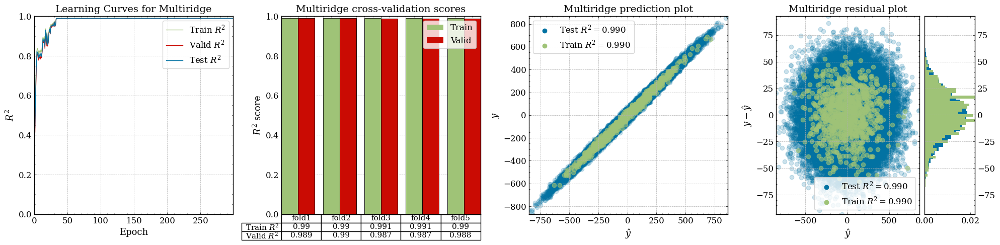

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.776, Valid r2: 0.745, Test r2: 0.750, Train mse: 0.224, Valid mse: 0.253, Test mse: 0.228
Epoch 11: Train r2: 0.748, Valid r2: 0.698, Test r2: 0.714, Train mse: 0.252, Valid mse: 0.298, Test mse: 0.261
Epoch 21: Train r2: 0.866, Valid r2: 0.845, Test r2: 0.838, Train mse: 0.134, Valid mse: 0.155, Test mse: 0.148
Epoch 31: Train r2: 0.918, Valid r2: 0.905, Test r2: 0.899, Train mse: 0.082, Valid mse: 0.093, Test mse: 0.092
Epoch 41: Train r2: 0.930, Valid r2: 0.916, Test r2: 0.913, Train mse: 0.070, Valid mse: 0.084, Test mse: 0.079
Epoch 51: Train r2: 0.948, Valid r2: 0.940, Test r2: 0.936, Train mse: 0.052, Valid mse: 0.060, Test mse: 0.058
Epoch 61: Train r2: 0.985, Valid r2: 0.982, Test r2: 0.981, Train mse: 0.015, Valid mse: 0.018, Test mse: 0.017
Epoch 71: Train r2: 0.985, Valid r2: 0.983, Test r2: 0.982, Train mse: 0.015, Valid mse: 0.017, Test mse: 0.016
Epoch 81: Train r2: 0.986, Valid r2: 0.984, Test r2: 0.983, Train mse: 0.014, Valid mse: 0.016, Test mse:

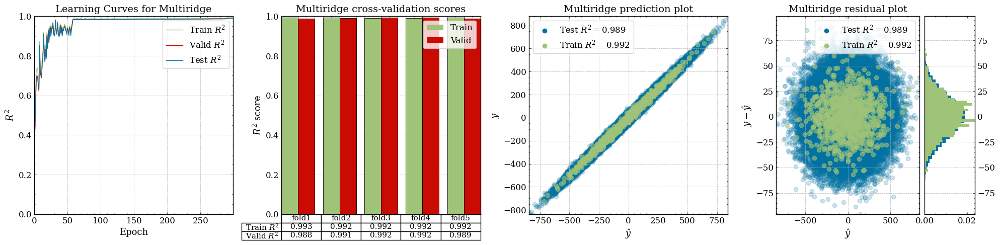

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.759, Valid r2: 0.725, Test r2: 0.725, Train mse: 0.241, Valid mse: 0.278, Test mse: 0.271
Epoch 11: Train r2: 0.798, Valid r2: 0.770, Test r2: 0.787, Train mse: 0.202, Valid mse: 0.228, Test mse: 0.210
Epoch 21: Train r2: 0.908, Valid r2: 0.893, Test r2: 0.887, Train mse: 0.092, Valid mse: 0.107, Test mse: 0.111
Epoch 31: Train r2: 0.954, Valid r2: 0.945, Test r2: 0.946, Train mse: 0.046, Valid mse: 0.054, Test mse: 0.053
Epoch 41: Train r2: 0.991, Valid r2: 0.989, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.011, Test mse: 0.010
Epoch 51: Train r2: 0.991, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.010, Test mse: 0.010
Epoch 61: Train r2: 0.991, Valid r2: 0.989, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.011, Test mse: 0.010
Epoch 71: Train r2: 0.991, Valid r2: 0.989, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.011, Test mse: 0.010
Epoch 81: Train r2: 0.991, Valid r2: 0.989, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.011, Test mse:

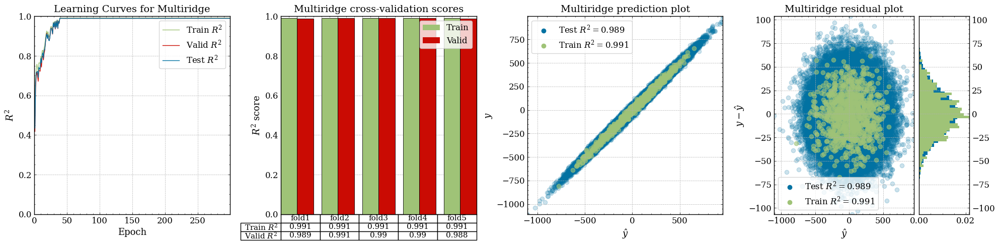

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.754, Valid r2: 0.720, Test r2: 0.723, Train mse: 0.246, Valid mse: 0.280, Test mse: 0.276
Epoch 11: Train r2: 0.763, Valid r2: 0.724, Test r2: 0.726, Train mse: 0.237, Valid mse: 0.273, Test mse: 0.272
Epoch 21: Train r2: 0.909, Valid r2: 0.893, Test r2: 0.892, Train mse: 0.091, Valid mse: 0.106, Test mse: 0.107
Epoch 31: Train r2: 0.957, Valid r2: 0.949, Test r2: 0.946, Train mse: 0.043, Valid mse: 0.051, Test mse: 0.054
Epoch 41: Train r2: 0.992, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.008, Valid mse: 0.010, Test mse: 0.011
Epoch 51: Train r2: 0.992, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.008, Valid mse: 0.010, Test mse: 0.011
Epoch 61: Train r2: 0.992, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.008, Valid mse: 0.010, Test mse: 0.011
Epoch 71: Train r2: 0.992, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.008, Valid mse: 0.010, Test mse: 0.011
Epoch 81: Train r2: 0.992, Valid r2: 0.990, Test r2: 0.989, Train mse: 0.008, Valid mse: 0.010, Test mse:

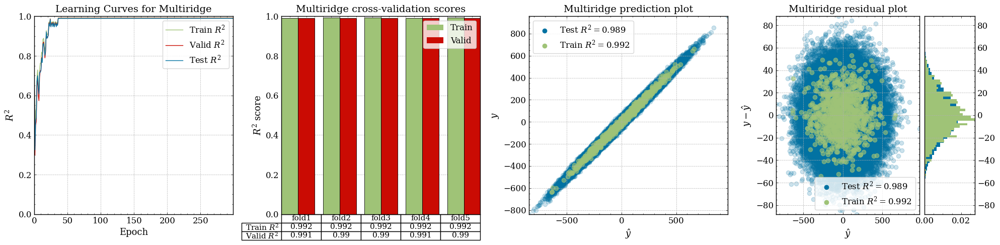

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.749, Valid r2: 0.715, Test r2: 0.725, Train mse: 0.251, Valid mse: 0.285, Test mse: 0.278
Epoch 11: Train r2: 0.690, Valid r2: 0.644, Test r2: 0.660, Train mse: 0.310, Valid mse: 0.354, Test mse: 0.344
Epoch 21: Train r2: 0.866, Valid r2: 0.842, Test r2: 0.852, Train mse: 0.134, Valid mse: 0.157, Test mse: 0.150
Epoch 31: Train r2: 0.930, Valid r2: 0.917, Test r2: 0.918, Train mse: 0.070, Valid mse: 0.081, Test mse: 0.083
Epoch 41: Train r2: 0.916, Valid r2: 0.898, Test r2: 0.902, Train mse: 0.084, Valid mse: 0.099, Test mse: 0.099
Epoch 51: Train r2: 0.926, Valid r2: 0.914, Test r2: 0.915, Train mse: 0.074, Valid mse: 0.086, Test mse: 0.086
Epoch 61: Train r2: 0.979, Valid r2: 0.975, Test r2: 0.976, Train mse: 0.021, Valid mse: 0.025, Test mse: 0.024
Epoch 71: Train r2: 0.952, Valid r2: 0.942, Test r2: 0.943, Train mse: 0.048, Valid mse: 0.057, Test mse: 0.058
Epoch 81: Train r2: 0.991, Valid r2: 0.989, Test r2: 0.989, Train mse: 0.009, Valid mse: 0.011, Test mse:

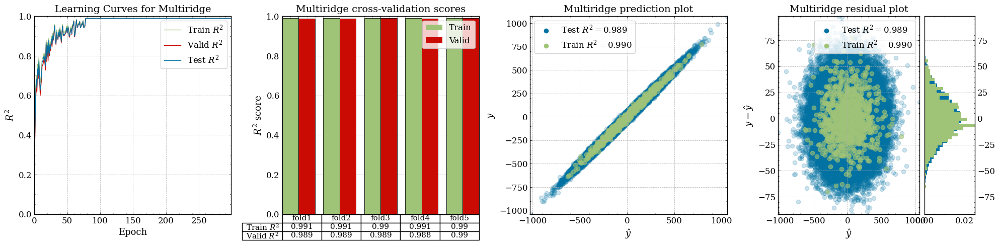

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.746, Valid r2: 0.717, Test r2: 0.718, Train mse: 0.254, Valid mse: 0.283, Test mse: 0.291
Epoch 11: Train r2: 0.842, Valid r2: 0.815, Test r2: 0.831, Train mse: 0.158, Valid mse: 0.186, Test mse: 0.174
Epoch 21: Train r2: 0.843, Valid r2: 0.821, Test r2: 0.822, Train mse: 0.157, Valid mse: 0.178, Test mse: 0.184
Epoch 31: Train r2: 0.944, Valid r2: 0.934, Test r2: 0.942, Train mse: 0.056, Valid mse: 0.066, Test mse: 0.060
Epoch 41: Train r2: 0.957, Valid r2: 0.949, Test r2: 0.952, Train mse: 0.043, Valid mse: 0.050, Test mse: 0.050
Epoch 51: Train r2: 0.985, Valid r2: 0.983, Test r2: 0.984, Train mse: 0.015, Valid mse: 0.017, Test mse: 0.017
Epoch 61: Train r2: 0.969, Valid r2: 0.963, Test r2: 0.966, Train mse: 0.031, Valid mse: 0.036, Test mse: 0.036
Epoch 71: Train r2: 0.986, Valid r2: 0.983, Test r2: 0.984, Train mse: 0.014, Valid mse: 0.017, Test mse: 0.016
Epoch 81: Train r2: 0.990, Valid r2: 0.988, Test r2: 0.989, Train mse: 0.010, Valid mse: 0.012, Test mse:

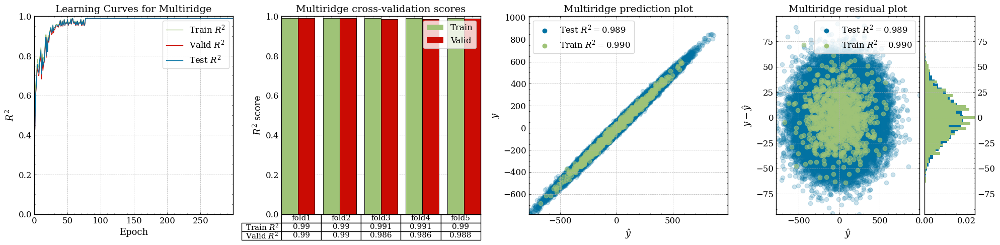

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.768, Valid r2: 0.733, Test r2: 0.741, Train mse: 0.232, Valid mse: 0.267, Test mse: 0.237
Epoch 11: Train r2: 0.875, Valid r2: 0.849, Test r2: 0.851, Train mse: 0.125, Valid mse: 0.150, Test mse: 0.136
Epoch 21: Train r2: 0.853, Valid r2: 0.828, Test r2: 0.824, Train mse: 0.147, Valid mse: 0.171, Test mse: 0.161
Epoch 31: Train r2: 0.876, Valid r2: 0.853, Test r2: 0.849, Train mse: 0.124, Valid mse: 0.146, Test mse: 0.138
Epoch 41: Train r2: 0.887, Valid r2: 0.866, Test r2: 0.857, Train mse: 0.113, Valid mse: 0.132, Test mse: 0.130
Epoch 51: Train r2: 0.972, Valid r2: 0.968, Test r2: 0.964, Train mse: 0.028, Valid mse: 0.032, Test mse: 0.033
Epoch 61: Train r2: 0.976, Valid r2: 0.972, Test r2: 0.969, Train mse: 0.024, Valid mse: 0.028, Test mse: 0.028
Epoch 71: Train r2: 0.956, Valid r2: 0.948, Test r2: 0.943, Train mse: 0.044, Valid mse: 0.052, Test mse: 0.052
Epoch 81: Train r2: 0.987, Valid r2: 0.985, Test r2: 0.983, Train mse: 0.013, Valid mse: 0.015, Test mse:

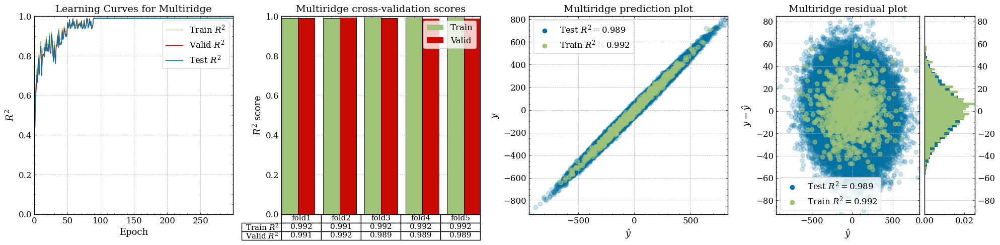

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.744, Valid r2: 0.711, Test r2: 0.714, Train mse: 0.256, Valid mse: 0.288, Test mse: 0.294
Epoch 11: Train r2: 0.863, Valid r2: 0.842, Test r2: 0.843, Train mse: 0.137, Valid mse: 0.156, Test mse: 0.161
Epoch 21: Train r2: 0.917, Valid r2: 0.901, Test r2: 0.907, Train mse: 0.083, Valid mse: 0.099, Test mse: 0.096
Epoch 31: Train r2: 0.983, Valid r2: 0.980, Test r2: 0.981, Train mse: 0.017, Valid mse: 0.020, Test mse: 0.019
Epoch 41: Train r2: 0.983, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.017, Valid mse: 0.020, Test mse: 0.019
Epoch 51: Train r2: 0.983, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.017, Valid mse: 0.020, Test mse: 0.018
Epoch 61: Train r2: 0.982, Valid r2: 0.979, Test r2: 0.981, Train mse: 0.018, Valid mse: 0.021, Test mse: 0.020
Epoch 71: Train r2: 0.982, Valid r2: 0.979, Test r2: 0.981, Train mse: 0.018, Valid mse: 0.021, Test mse: 0.020
Epoch 81: Train r2: 0.984, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.016, Valid mse: 0.018, Test mse:

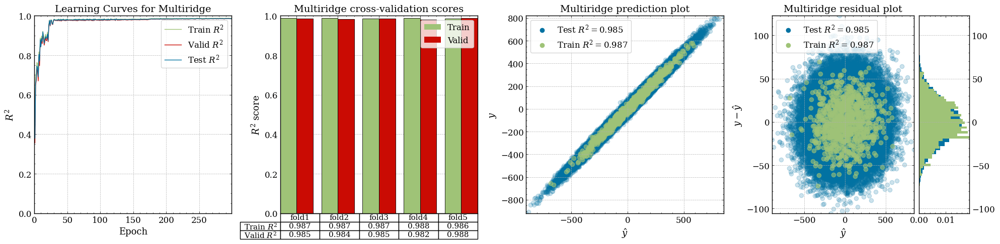

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.752, Valid r2: 0.678, Test r2: 0.679, Train mse: 0.248, Valid mse: 0.323, Test mse: 0.337
Epoch 11: Train r2: 0.913, Valid r2: 0.883, Test r2: 0.893, Train mse: 0.087, Valid mse: 0.117, Test mse: 0.113
Epoch 21: Train r2: 0.986, Valid r2: 0.981, Test r2: 0.980, Train mse: 0.014, Valid mse: 0.019, Test mse: 0.020
Epoch 31: Train r2: 0.987, Valid r2: 0.982, Test r2: 0.982, Train mse: 0.013, Valid mse: 0.018, Test mse: 0.018
Epoch 41: Train r2: 0.988, Valid r2: 0.982, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.017, Test mse: 0.018
Epoch 51: Train r2: 0.988, Valid r2: 0.983, Test r2: 0.983, Train mse: 0.012, Valid mse: 0.017, Test mse: 0.018
Epoch 61: Train r2: 0.988, Valid r2: 0.983, Test r2: 0.984, Train mse: 0.012, Valid mse: 0.016, Test mse: 0.017
Epoch 71: Train r2: 0.988, Valid r2: 0.983, Test r2: 0.983, Train mse: 0.012, Valid mse: 0.016, Test mse: 0.017
Epoch 81: Train r2: 0.988, Valid r2: 0.982, Test r2: 0.983, Train mse: 0.012, Valid mse: 0.018, Test mse:

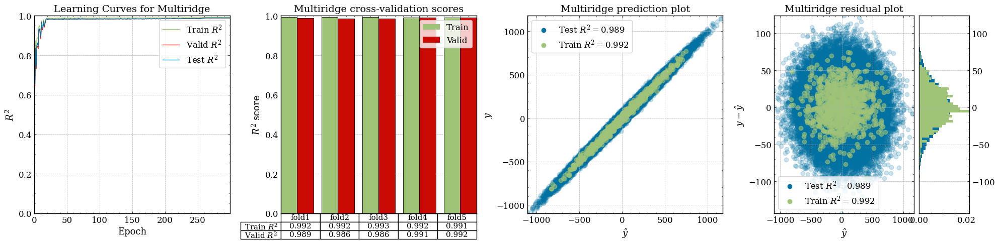

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.761, Valid r2: 0.689, Test r2: 0.697, Train mse: 0.239, Valid mse: 0.310, Test mse: 0.303
Epoch 11: Train r2: 0.938, Valid r2: 0.915, Test r2: 0.922, Train mse: 0.062, Valid mse: 0.082, Test mse: 0.078
Epoch 21: Train r2: 0.975, Valid r2: 0.964, Test r2: 0.969, Train mse: 0.025, Valid mse: 0.035, Test mse: 0.030
Epoch 31: Train r2: 0.969, Valid r2: 0.957, Test r2: 0.963, Train mse: 0.031, Valid mse: 0.042, Test mse: 0.037
Epoch 41: Train r2: 0.973, Valid r2: 0.961, Test r2: 0.966, Train mse: 0.027, Valid mse: 0.039, Test mse: 0.034
Epoch 51: Train r2: 0.971, Valid r2: 0.961, Test r2: 0.964, Train mse: 0.029, Valid mse: 0.038, Test mse: 0.036
Epoch 61: Train r2: 0.979, Valid r2: 0.970, Test r2: 0.974, Train mse: 0.021, Valid mse: 0.029, Test mse: 0.026
Epoch 71: Train r2: 0.975, Valid r2: 0.966, Test r2: 0.969, Train mse: 0.025, Valid mse: 0.034, Test mse: 0.031
Epoch 81: Train r2: 0.975, Valid r2: 0.966, Test r2: 0.970, Train mse: 0.025, Valid mse: 0.033, Test mse:

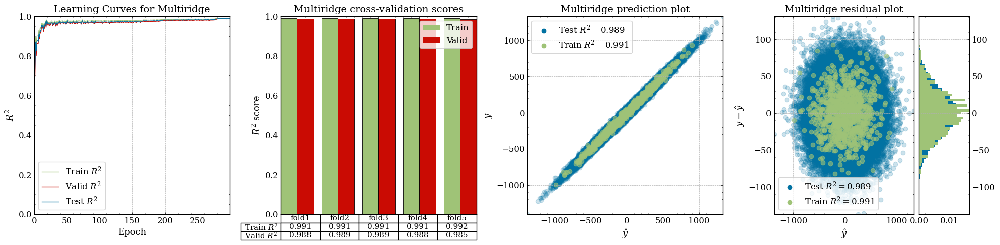

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.770, Valid r2: 0.707, Test r2: 0.710, Train mse: 0.230, Valid mse: 0.295, Test mse: 0.280
Epoch 11: Train r2: 0.948, Valid r2: 0.929, Test r2: 0.928, Train mse: 0.052, Valid mse: 0.071, Test mse: 0.070
Epoch 21: Train r2: 0.976, Valid r2: 0.965, Test r2: 0.967, Train mse: 0.024, Valid mse: 0.034, Test mse: 0.032
Epoch 31: Train r2: 0.980, Valid r2: 0.971, Test r2: 0.972, Train mse: 0.020, Valid mse: 0.029, Test mse: 0.027
Epoch 41: Train r2: 0.979, Valid r2: 0.971, Test r2: 0.971, Train mse: 0.021, Valid mse: 0.029, Test mse: 0.028
Epoch 51: Train r2: 0.979, Valid r2: 0.971, Test r2: 0.970, Train mse: 0.021, Valid mse: 0.029, Test mse: 0.029
Epoch 61: Train r2: 0.980, Valid r2: 0.971, Test r2: 0.971, Train mse: 0.020, Valid mse: 0.029, Test mse: 0.028
Epoch 71: Train r2: 0.981, Valid r2: 0.973, Test r2: 0.973, Train mse: 0.019, Valid mse: 0.027, Test mse: 0.026
Epoch 81: Train r2: 0.980, Valid r2: 0.972, Test r2: 0.972, Train mse: 0.020, Valid mse: 0.028, Test mse:

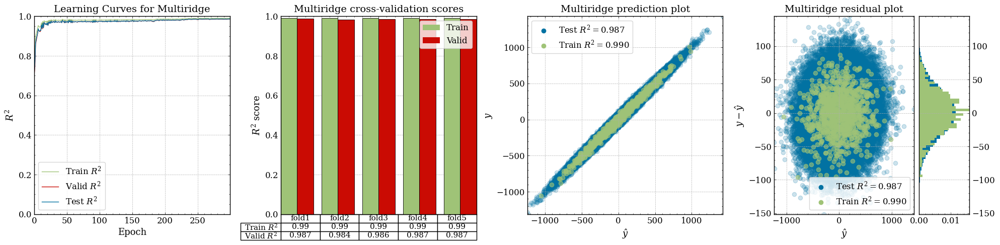

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.747, Valid r2: 0.673, Test r2: 0.679, Train mse: 0.253, Valid mse: 0.327, Test mse: 0.347
Epoch 11: Train r2: 0.959, Valid r2: 0.940, Test r2: 0.949, Train mse: 0.041, Valid mse: 0.060, Test mse: 0.055
Epoch 21: Train r2: 0.975, Valid r2: 0.964, Test r2: 0.969, Train mse: 0.025, Valid mse: 0.036, Test mse: 0.034
Epoch 31: Train r2: 0.982, Valid r2: 0.974, Test r2: 0.978, Train mse: 0.018, Valid mse: 0.026, Test mse: 0.024
Epoch 41: Train r2: 0.975, Valid r2: 0.964, Test r2: 0.969, Train mse: 0.025, Valid mse: 0.035, Test mse: 0.033
Epoch 51: Train r2: 0.981, Valid r2: 0.973, Test r2: 0.977, Train mse: 0.019, Valid mse: 0.027, Test mse: 0.025
Epoch 61: Train r2: 0.983, Valid r2: 0.976, Test r2: 0.980, Train mse: 0.017, Valid mse: 0.024, Test mse: 0.022
Epoch 71: Train r2: 0.982, Valid r2: 0.973, Test r2: 0.978, Train mse: 0.018, Valid mse: 0.026, Test mse: 0.024
Epoch 81: Train r2: 0.983, Valid r2: 0.977, Test r2: 0.980, Train mse: 0.017, Valid mse: 0.023, Test mse:

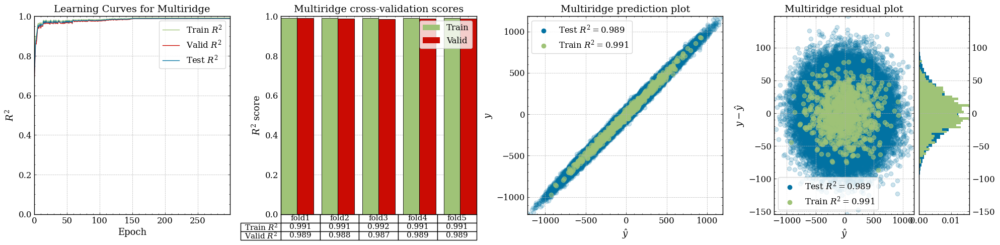

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.771, Valid r2: 0.699, Test r2: 0.712, Train mse: 0.229, Valid mse: 0.300, Test mse: 0.278
Epoch 11: Train r2: 0.950, Valid r2: 0.931, Test r2: 0.931, Train mse: 0.050, Valid mse: 0.069, Test mse: 0.066
Epoch 21: Train r2: 0.975, Valid r2: 0.965, Test r2: 0.965, Train mse: 0.025, Valid mse: 0.035, Test mse: 0.034
Epoch 31: Train r2: 0.977, Valid r2: 0.968, Test r2: 0.967, Train mse: 0.023, Valid mse: 0.032, Test mse: 0.032
Epoch 41: Train r2: 0.977, Valid r2: 0.968, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.032, Test mse: 0.031
Epoch 51: Train r2: 0.977, Valid r2: 0.968, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.031, Test mse: 0.031
Epoch 61: Train r2: 0.978, Valid r2: 0.969, Test r2: 0.969, Train mse: 0.022, Valid mse: 0.031, Test mse: 0.030
Epoch 71: Train r2: 0.977, Valid r2: 0.969, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.031, Test mse: 0.031
Epoch 81: Train r2: 0.977, Valid r2: 0.968, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.032, Test mse:

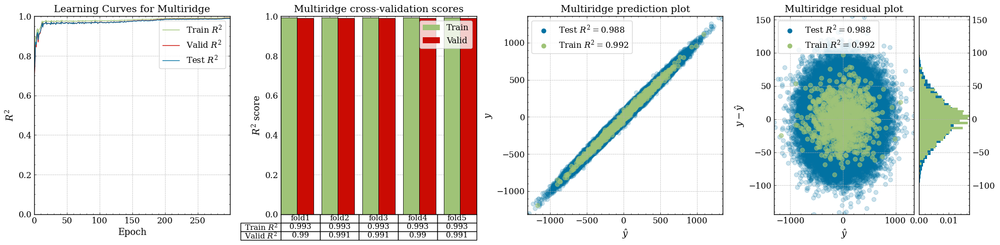

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.752, Valid r2: 0.680, Test r2: 0.695, Train mse: 0.248, Valid mse: 0.319, Test mse: 0.318
Epoch 11: Train r2: 0.924, Valid r2: 0.896, Test r2: 0.899, Train mse: 0.076, Valid mse: 0.104, Test mse: 0.105
Epoch 21: Train r2: 0.932, Valid r2: 0.905, Test r2: 0.918, Train mse: 0.068, Valid mse: 0.095, Test mse: 0.085
Epoch 31: Train r2: 0.959, Valid r2: 0.942, Test r2: 0.947, Train mse: 0.041, Valid mse: 0.057, Test mse: 0.055
Epoch 41: Train r2: 0.983, Valid r2: 0.977, Test r2: 0.978, Train mse: 0.017, Valid mse: 0.023, Test mse: 0.023
Epoch 51: Train r2: 0.979, Valid r2: 0.971, Test r2: 0.973, Train mse: 0.021, Valid mse: 0.029, Test mse: 0.028
Epoch 61: Train r2: 0.989, Valid r2: 0.984, Test r2: 0.985, Train mse: 0.011, Valid mse: 0.016, Test mse: 0.015
Epoch 71: Train r2: 0.989, Valid r2: 0.985, Test r2: 0.986, Train mse: 0.011, Valid mse: 0.015, Test mse: 0.015
Epoch 81: Train r2: 0.988, Valid r2: 0.983, Test r2: 0.985, Train mse: 0.012, Valid mse: 0.016, Test mse:

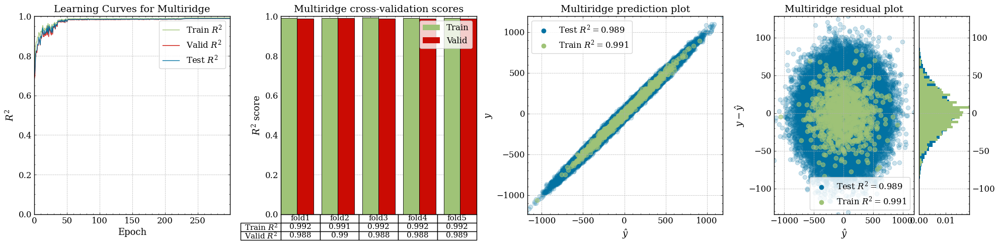

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.775, Valid r2: 0.710, Test r2: 0.715, Train mse: 0.225, Valid mse: 0.290, Test mse: 0.272
Epoch 11: Train r2: 0.967, Valid r2: 0.953, Test r2: 0.953, Train mse: 0.033, Valid mse: 0.047, Test mse: 0.044
Epoch 21: Train r2: 0.977, Valid r2: 0.967, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.033, Test mse: 0.031
Epoch 31: Train r2: 0.983, Valid r2: 0.975, Test r2: 0.976, Train mse: 0.017, Valid mse: 0.025, Test mse: 0.023
Epoch 41: Train r2: 0.977, Valid r2: 0.967, Test r2: 0.968, Train mse: 0.023, Valid mse: 0.032, Test mse: 0.031
Epoch 51: Train r2: 0.979, Valid r2: 0.969, Test r2: 0.970, Train mse: 0.021, Valid mse: 0.030, Test mse: 0.028
Epoch 61: Train r2: 0.982, Valid r2: 0.974, Test r2: 0.974, Train mse: 0.018, Valid mse: 0.026, Test mse: 0.024
Epoch 71: Train r2: 0.981, Valid r2: 0.972, Test r2: 0.974, Train mse: 0.019, Valid mse: 0.027, Test mse: 0.025
Epoch 81: Train r2: 0.979, Valid r2: 0.970, Test r2: 0.970, Train mse: 0.021, Valid mse: 0.030, Test mse:

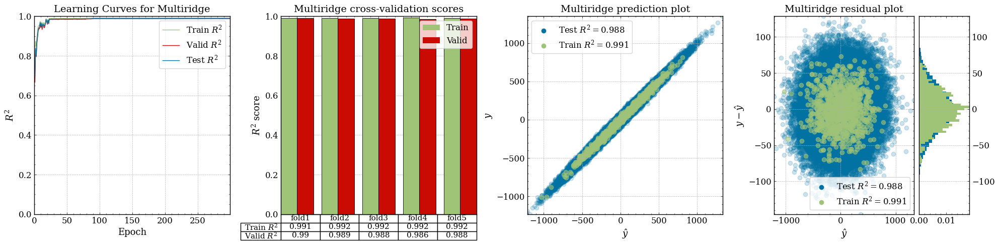

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.765, Valid r2: 0.697, Test r2: 0.704, Train mse: 0.235, Valid mse: 0.303, Test mse: 0.293
Epoch 11: Train r2: 0.945, Valid r2: 0.922, Test r2: 0.936, Train mse: 0.055, Valid mse: 0.078, Test mse: 0.064
Epoch 21: Train r2: 0.968, Valid r2: 0.955, Test r2: 0.960, Train mse: 0.032, Valid mse: 0.044, Test mse: 0.040
Epoch 31: Train r2: 0.980, Valid r2: 0.971, Test r2: 0.973, Train mse: 0.020, Valid mse: 0.029, Test mse: 0.027
Epoch 41: Train r2: 0.978, Valid r2: 0.969, Test r2: 0.969, Train mse: 0.022, Valid mse: 0.030, Test mse: 0.030
Epoch 51: Train r2: 0.983, Valid r2: 0.976, Test r2: 0.977, Train mse: 0.017, Valid mse: 0.024, Test mse: 0.023
Epoch 61: Train r2: 0.985, Valid r2: 0.979, Test r2: 0.980, Train mse: 0.015, Valid mse: 0.021, Test mse: 0.020
Epoch 71: Train r2: 0.980, Valid r2: 0.971, Test r2: 0.972, Train mse: 0.020, Valid mse: 0.029, Test mse: 0.028
Epoch 81: Train r2: 0.982, Valid r2: 0.975, Test r2: 0.975, Train mse: 0.018, Valid mse: 0.025, Test mse:

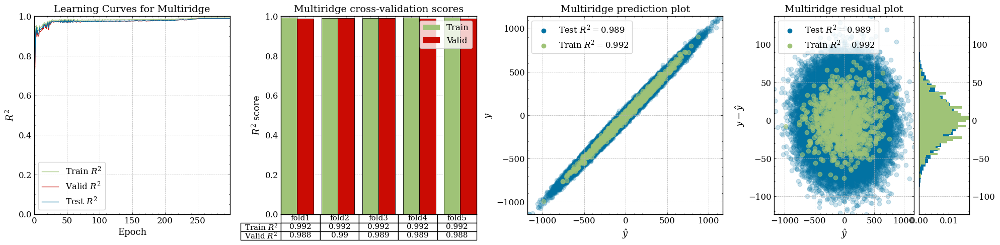

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.741, Valid r2: 0.666, Test r2: 0.672, Train mse: 0.259, Valid mse: 0.333, Test mse: 0.360
Epoch 11: Train r2: 0.960, Valid r2: 0.944, Test r2: 0.949, Train mse: 0.040, Valid mse: 0.055, Test mse: 0.056
Epoch 21: Train r2: 0.984, Valid r2: 0.977, Test r2: 0.980, Train mse: 0.016, Valid mse: 0.023, Test mse: 0.022
Epoch 31: Train r2: 0.986, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.014, Valid mse: 0.020, Test mse: 0.020
Epoch 41: Train r2: 0.988, Valid r2: 0.982, Test r2: 0.984, Train mse: 0.012, Valid mse: 0.018, Test mse: 0.018
Epoch 51: Train r2: 0.989, Valid r2: 0.985, Test r2: 0.986, Train mse: 0.011, Valid mse: 0.015, Test mse: 0.016
Epoch 61: Train r2: 0.987, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.013, Valid mse: 0.019, Test mse: 0.018
Epoch 71: Train r2: 0.989, Valid r2: 0.984, Test r2: 0.985, Train mse: 0.011, Valid mse: 0.016, Test mse: 0.016
Epoch 81: Train r2: 0.987, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.013, Valid mse: 0.018, Test mse:

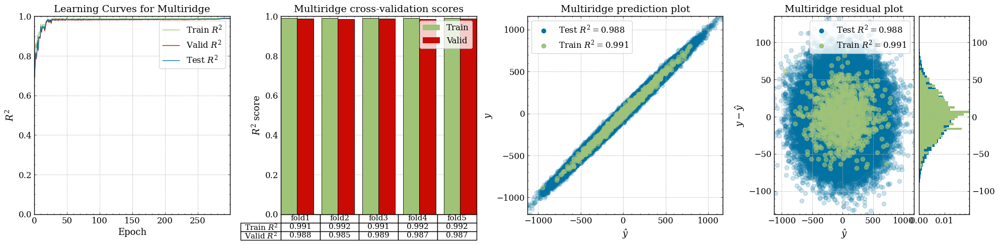

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.766, Valid r2: 0.655, Test r2: 0.676, Train mse: 0.234, Valid mse: 0.342, Test mse: 0.334
Epoch 11: Train r2: 0.969, Valid r2: 0.947, Test r2: 0.954, Train mse: 0.031, Valid mse: 0.051, Test mse: 0.048
Epoch 21: Train r2: 0.978, Valid r2: 0.964, Test r2: 0.968, Train mse: 0.022, Valid mse: 0.036, Test mse: 0.033
Epoch 31: Train r2: 0.984, Valid r2: 0.974, Test r2: 0.977, Train mse: 0.016, Valid mse: 0.026, Test mse: 0.024
Epoch 41: Train r2: 0.985, Valid r2: 0.974, Test r2: 0.977, Train mse: 0.015, Valid mse: 0.026, Test mse: 0.023
Epoch 51: Train r2: 0.985, Valid r2: 0.974, Test r2: 0.978, Train mse: 0.015, Valid mse: 0.026, Test mse: 0.023
Epoch 61: Train r2: 0.987, Valid r2: 0.978, Test r2: 0.981, Train mse: 0.013, Valid mse: 0.021, Test mse: 0.020
Epoch 71: Train r2: 0.988, Valid r2: 0.979, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.018
Epoch 81: Train r2: 0.988, Valid r2: 0.979, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.021, Test mse:

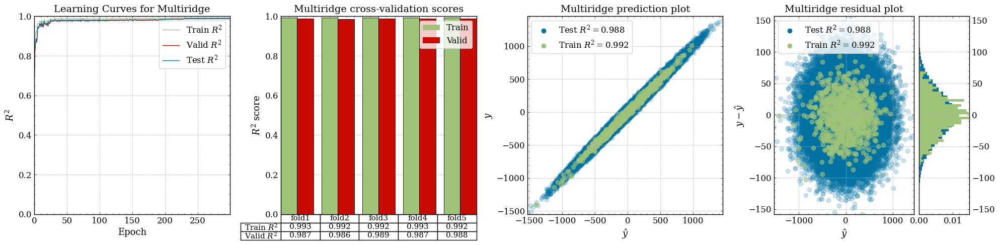

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.767, Valid r2: 0.659, Test r2: 0.675, Train mse: 0.233, Valid mse: 0.341, Test mse: 0.333
Epoch 11: Train r2: 0.958, Valid r2: 0.929, Test r2: 0.944, Train mse: 0.042, Valid mse: 0.071, Test mse: 0.057
Epoch 21: Train r2: 0.981, Valid r2: 0.967, Test r2: 0.971, Train mse: 0.019, Valid mse: 0.032, Test mse: 0.029
Epoch 31: Train r2: 0.984, Valid r2: 0.972, Test r2: 0.975, Train mse: 0.016, Valid mse: 0.028, Test mse: 0.026
Epoch 41: Train r2: 0.985, Valid r2: 0.974, Test r2: 0.977, Train mse: 0.015, Valid mse: 0.026, Test mse: 0.024
Epoch 51: Train r2: 0.982, Valid r2: 0.970, Test r2: 0.973, Train mse: 0.018, Valid mse: 0.030, Test mse: 0.028
Epoch 61: Train r2: 0.987, Valid r2: 0.976, Test r2: 0.980, Train mse: 0.013, Valid mse: 0.023, Test mse: 0.021
Epoch 71: Train r2: 0.989, Valid r2: 0.980, Test r2: 0.983, Train mse: 0.011, Valid mse: 0.019, Test mse: 0.018
Epoch 81: Train r2: 0.988, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.020, Test mse:

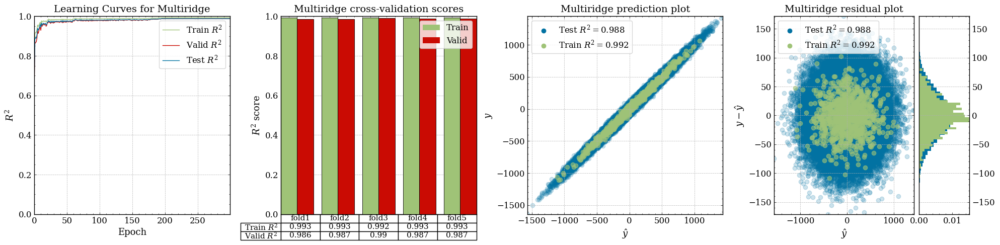

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.757, Valid r2: 0.643, Test r2: 0.677, Train mse: 0.243, Valid mse: 0.355, Test mse: 0.344
Epoch 11: Train r2: 0.962, Valid r2: 0.935, Test r2: 0.946, Train mse: 0.038, Valid mse: 0.064, Test mse: 0.057
Epoch 21: Train r2: 0.982, Valid r2: 0.968, Test r2: 0.972, Train mse: 0.018, Valid mse: 0.032, Test mse: 0.030
Epoch 31: Train r2: 0.987, Valid r2: 0.979, Test r2: 0.979, Train mse: 0.013, Valid mse: 0.021, Test mse: 0.022
Epoch 41: Train r2: 0.988, Valid r2: 0.980, Test r2: 0.980, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.021
Epoch 51: Train r2: 0.988, Valid r2: 0.979, Test r2: 0.981, Train mse: 0.012, Valid mse: 0.021, Test mse: 0.021
Epoch 61: Train r2: 0.988, Valid r2: 0.978, Test r2: 0.980, Train mse: 0.012, Valid mse: 0.022, Test mse: 0.021
Epoch 71: Train r2: 0.989, Valid r2: 0.980, Test r2: 0.981, Train mse: 0.011, Valid mse: 0.020, Test mse: 0.020
Epoch 81: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.982, Train mse: 0.011, Valid mse: 0.019, Test mse:

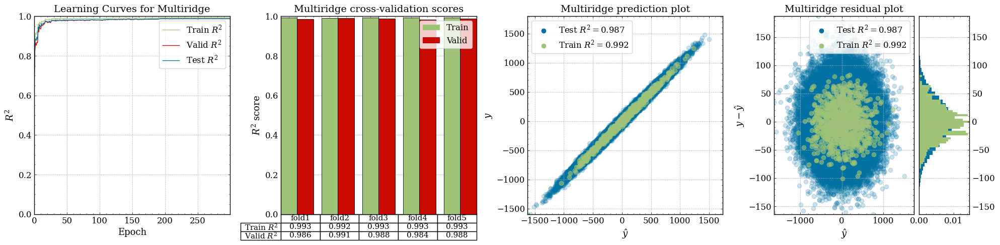

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.760, Valid r2: 0.636, Test r2: 0.667, Train mse: 0.240, Valid mse: 0.360, Test mse: 0.352
Epoch 11: Train r2: 0.980, Valid r2: 0.966, Test r2: 0.966, Train mse: 0.020, Valid mse: 0.034, Test mse: 0.035
Epoch 21: Train r2: 0.984, Valid r2: 0.973, Test r2: 0.971, Train mse: 0.016, Valid mse: 0.027, Test mse: 0.031
Epoch 31: Train r2: 0.986, Valid r2: 0.977, Test r2: 0.976, Train mse: 0.014, Valid mse: 0.023, Test mse: 0.025
Epoch 41: Train r2: 0.987, Valid r2: 0.978, Test r2: 0.977, Train mse: 0.013, Valid mse: 0.022, Test mse: 0.024
Epoch 51: Train r2: 0.984, Valid r2: 0.974, Test r2: 0.972, Train mse: 0.016, Valid mse: 0.026, Test mse: 0.029
Epoch 61: Train r2: 0.988, Valid r2: 0.978, Test r2: 0.977, Train mse: 0.012, Valid mse: 0.021, Test mse: 0.024
Epoch 71: Train r2: 0.988, Valid r2: 0.978, Test r2: 0.979, Train mse: 0.012, Valid mse: 0.021, Test mse: 0.023
Epoch 81: Train r2: 0.986, Valid r2: 0.976, Test r2: 0.975, Train mse: 0.014, Valid mse: 0.024, Test mse:

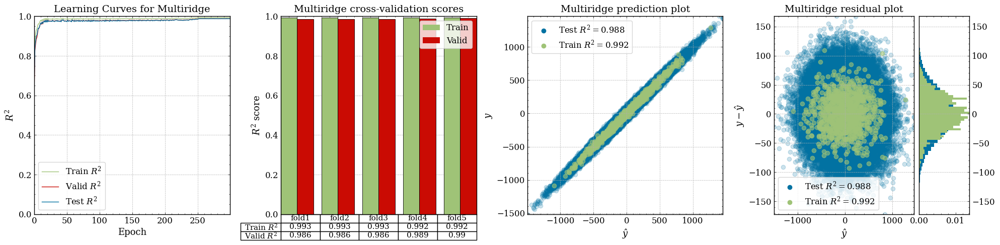

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.773, Valid r2: 0.666, Test r2: 0.695, Train mse: 0.227, Valid mse: 0.334, Test mse: 0.300
Epoch 11: Train r2: 0.957, Valid r2: 0.928, Test r2: 0.936, Train mse: 0.043, Valid mse: 0.071, Test mse: 0.063
Epoch 21: Train r2: 0.974, Valid r2: 0.954, Test r2: 0.959, Train mse: 0.026, Valid mse: 0.045, Test mse: 0.041
Epoch 31: Train r2: 0.986, Valid r2: 0.976, Test r2: 0.978, Train mse: 0.014, Valid mse: 0.024, Test mse: 0.022
Epoch 41: Train r2: 0.984, Valid r2: 0.973, Test r2: 0.975, Train mse: 0.016, Valid mse: 0.026, Test mse: 0.025
Epoch 51: Train r2: 0.982, Valid r2: 0.969, Test r2: 0.972, Train mse: 0.018, Valid mse: 0.031, Test mse: 0.027
Epoch 61: Train r2: 0.985, Valid r2: 0.976, Test r2: 0.977, Train mse: 0.015, Valid mse: 0.024, Test mse: 0.023
Epoch 71: Train r2: 0.986, Valid r2: 0.974, Test r2: 0.977, Train mse: 0.014, Valid mse: 0.025, Test mse: 0.023
Epoch 81: Train r2: 0.984, Valid r2: 0.974, Test r2: 0.975, Train mse: 0.016, Valid mse: 0.026, Test mse:

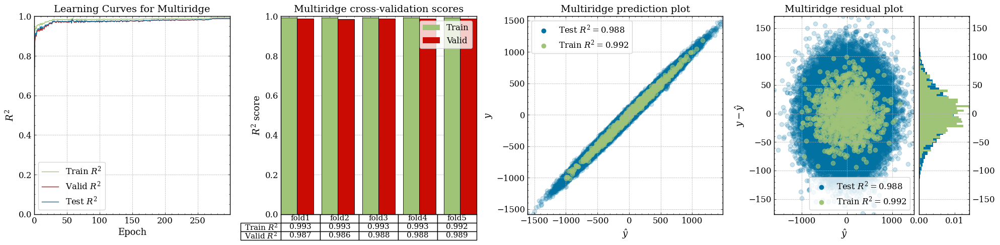

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.766, Valid r2: 0.656, Test r2: 0.680, Train mse: 0.234, Valid mse: 0.344, Test mse: 0.330
Epoch 11: Train r2: 0.961, Valid r2: 0.933, Test r2: 0.937, Train mse: 0.039, Valid mse: 0.067, Test mse: 0.065
Epoch 21: Train r2: 0.988, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.012, Valid mse: 0.019, Test mse: 0.018
Epoch 31: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.984, Train mse: 0.011, Valid mse: 0.018, Test mse: 0.017
Epoch 41: Train r2: 0.991, Valid r2: 0.984, Test r2: 0.986, Train mse: 0.009, Valid mse: 0.016, Test mse: 0.015
Epoch 51: Train r2: 0.988, Valid r2: 0.980, Test r2: 0.983, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.018
Epoch 61: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.984, Train mse: 0.011, Valid mse: 0.019, Test mse: 0.017
Epoch 71: Train r2: 0.991, Valid r2: 0.984, Test r2: 0.986, Train mse: 0.009, Valid mse: 0.016, Test mse: 0.014
Epoch 81: Train r2: 0.989, Valid r2: 0.982, Test r2: 0.984, Train mse: 0.011, Valid mse: 0.018, Test mse:

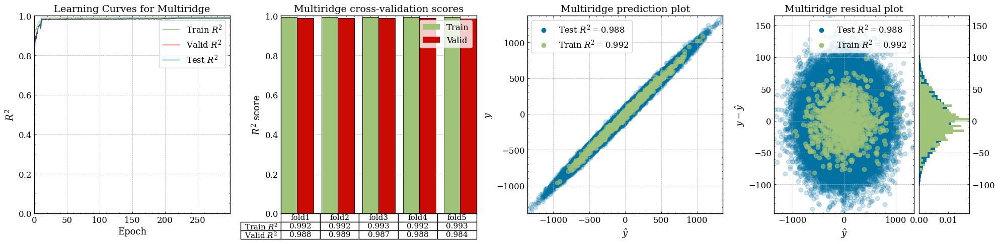

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.763, Valid r2: 0.663, Test r2: 0.684, Train mse: 0.237, Valid mse: 0.338, Test mse: 0.325
Epoch 11: Train r2: 0.948, Valid r2: 0.915, Test r2: 0.924, Train mse: 0.052, Valid mse: 0.085, Test mse: 0.078
Epoch 21: Train r2: 0.983, Valid r2: 0.972, Test r2: 0.974, Train mse: 0.017, Valid mse: 0.027, Test mse: 0.027
Epoch 31: Train r2: 0.990, Valid r2: 0.983, Test r2: 0.985, Train mse: 0.010, Valid mse: 0.017, Test mse: 0.016
Epoch 41: Train r2: 0.990, Valid r2: 0.982, Test r2: 0.984, Train mse: 0.010, Valid mse: 0.018, Test mse: 0.016
Epoch 51: Train r2: 0.990, Valid r2: 0.983, Test r2: 0.985, Train mse: 0.010, Valid mse: 0.017, Test mse: 0.016
Epoch 61: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.984, Train mse: 0.011, Valid mse: 0.018, Test mse: 0.017
Epoch 71: Train r2: 0.990, Valid r2: 0.982, Test r2: 0.984, Train mse: 0.010, Valid mse: 0.018, Test mse: 0.017
Epoch 81: Train r2: 0.990, Valid r2: 0.982, Test r2: 0.984, Train mse: 0.010, Valid mse: 0.017, Test mse:

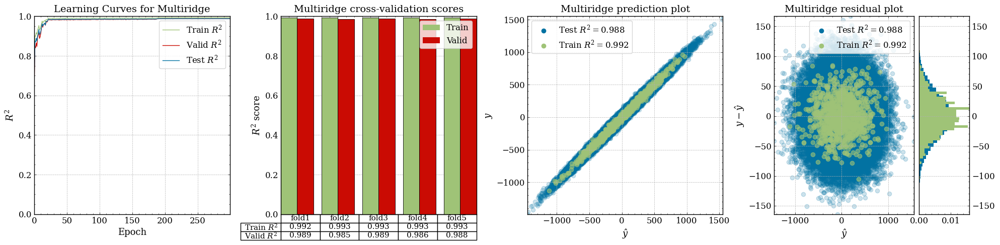

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.775, Valid r2: 0.674, Test r2: 0.690, Train mse: 0.225, Valid mse: 0.328, Test mse: 0.306
Epoch 11: Train r2: 0.969, Valid r2: 0.950, Test r2: 0.952, Train mse: 0.031, Valid mse: 0.050, Test mse: 0.047
Epoch 21: Train r2: 0.980, Valid r2: 0.967, Test r2: 0.970, Train mse: 0.020, Valid mse: 0.033, Test mse: 0.030
Epoch 31: Train r2: 0.984, Valid r2: 0.973, Test r2: 0.975, Train mse: 0.016, Valid mse: 0.027, Test mse: 0.025
Epoch 41: Train r2: 0.980, Valid r2: 0.966, Test r2: 0.969, Train mse: 0.020, Valid mse: 0.034, Test mse: 0.030
Epoch 51: Train r2: 0.985, Valid r2: 0.974, Test r2: 0.976, Train mse: 0.015, Valid mse: 0.026, Test mse: 0.024
Epoch 61: Train r2: 0.983, Valid r2: 0.970, Test r2: 0.973, Train mse: 0.017, Valid mse: 0.030, Test mse: 0.027
Epoch 71: Train r2: 0.984, Valid r2: 0.972, Test r2: 0.975, Train mse: 0.016, Valid mse: 0.027, Test mse: 0.024
Epoch 81: Train r2: 0.981, Valid r2: 0.968, Test r2: 0.970, Train mse: 0.019, Valid mse: 0.032, Test mse:

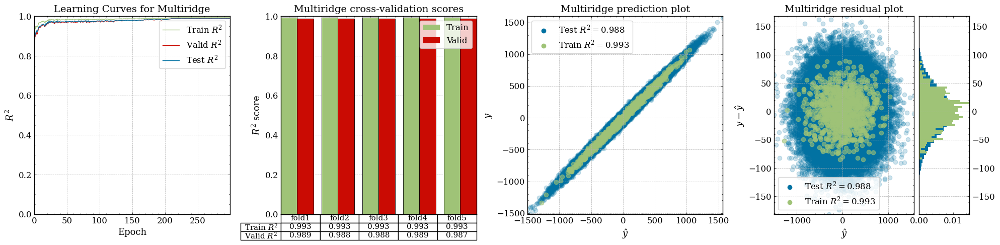

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.772, Valid r2: 0.673, Test r2: 0.680, Train mse: 0.228, Valid mse: 0.328, Test mse: 0.323
Epoch 11: Train r2: 0.975, Valid r2: 0.958, Test r2: 0.960, Train mse: 0.025, Valid mse: 0.042, Test mse: 0.040
Epoch 21: Train r2: 0.987, Valid r2: 0.978, Test r2: 0.979, Train mse: 0.013, Valid mse: 0.021, Test mse: 0.021
Epoch 31: Train r2: 0.990, Valid r2: 0.983, Test r2: 0.983, Train mse: 0.010, Valid mse: 0.017, Test mse: 0.017
Epoch 41: Train r2: 0.989, Valid r2: 0.982, Test r2: 0.982, Train mse: 0.011, Valid mse: 0.018, Test mse: 0.019
Epoch 51: Train r2: 0.989, Valid r2: 0.982, Test r2: 0.981, Train mse: 0.011, Valid mse: 0.018, Test mse: 0.019
Epoch 61: Train r2: 0.989, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.011, Valid mse: 0.019, Test mse: 0.018
Epoch 71: Train r2: 0.988, Valid r2: 0.980, Test r2: 0.980, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.020
Epoch 81: Train r2: 0.989, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.011, Valid mse: 0.019, Test mse:

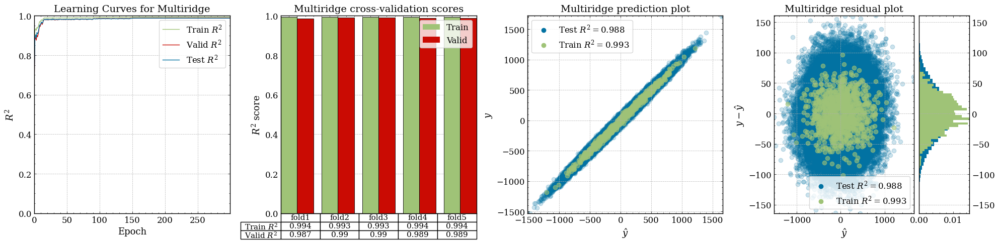

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.773, Valid r2: 0.662, Test r2: 0.679, Train mse: 0.227, Valid mse: 0.336, Test mse: 0.324
Epoch 11: Train r2: 0.961, Valid r2: 0.936, Test r2: 0.947, Train mse: 0.039, Valid mse: 0.063, Test mse: 0.053
Epoch 21: Train r2: 0.983, Valid r2: 0.970, Test r2: 0.973, Train mse: 0.017, Valid mse: 0.029, Test mse: 0.028
Epoch 31: Train r2: 0.987, Valid r2: 0.977, Test r2: 0.980, Train mse: 0.013, Valid mse: 0.022, Test mse: 0.020
Epoch 41: Train r2: 0.988, Valid r2: 0.979, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.019
Epoch 51: Train r2: 0.988, Valid r2: 0.979, Test r2: 0.981, Train mse: 0.012, Valid mse: 0.021, Test mse: 0.019
Epoch 61: Train r2: 0.988, Valid r2: 0.980, Test r2: 0.982, Train mse: 0.012, Valid mse: 0.020, Test mse: 0.018
Epoch 71: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.011, Valid mse: 0.019, Test mse: 0.018
Epoch 81: Train r2: 0.989, Valid r2: 0.981, Test r2: 0.983, Train mse: 0.011, Valid mse: 0.019, Test mse:

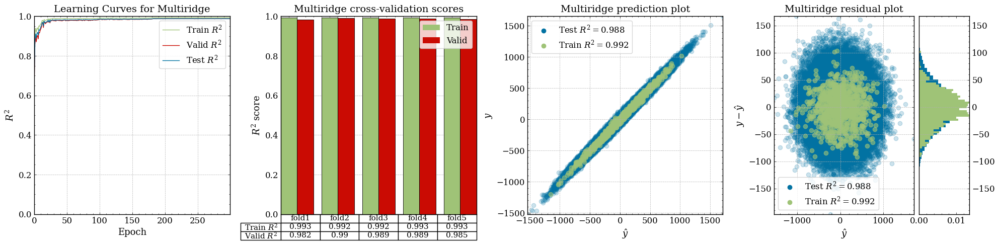

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.777, Valid r2: 0.641, Test r2: 0.640, Train mse: 0.223, Valid mse: 0.359, Test mse: 0.386
Epoch 11: Train r2: 0.987, Valid r2: 0.974, Test r2: 0.976, Train mse: 0.013, Valid mse: 0.026, Test mse: 0.026
Epoch 21: Train r2: 0.990, Valid r2: 0.979, Test r2: 0.980, Train mse: 0.010, Valid mse: 0.021, Test mse: 0.022
Epoch 31: Train r2: 0.994, Valid r2: 0.986, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.014, Test mse: 0.014
Epoch 41: Train r2: 0.994, Valid r2: 0.986, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.013, Test mse: 0.014
Epoch 51: Train r2: 0.994, Valid r2: 0.987, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.013, Test mse: 0.014
Epoch 61: Train r2: 0.994, Valid r2: 0.986, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.014, Test mse: 0.014
Epoch 71: Train r2: 0.994, Valid r2: 0.987, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.013, Test mse: 0.014
Epoch 81: Train r2: 0.994, Valid r2: 0.987, Test r2: 0.987, Train mse: 0.006, Valid mse: 0.013, Test mse:

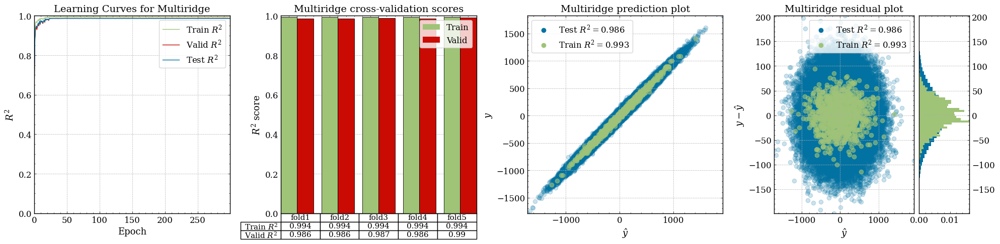

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1: Train r2: 0.796, Valid r2: 0.660, Test r2: 0.689, Train mse: 0.204, Valid mse: 0.337, Test mse: 0.287
Epoch 11: Train r2: 0.985, Valid r2: 0.969, Test r2: 0.973, Train mse: 0.015, Valid mse: 0.031, Test mse: 0.025
Epoch 21: Train r2: 0.989, Valid r2: 0.977, Test r2: 0.977, Train mse: 0.011, Valid mse: 0.023, Test mse: 0.022
Epoch 31: Train r2: 0.990, Valid r2: 0.978, Test r2: 0.979, Train mse: 0.010, Valid mse: 0.021, Test mse: 0.019
Epoch 41: Train r2: 0.991, Valid r2: 0.981, Test r2: 0.982, Train mse: 0.009, Valid mse: 0.019, Test mse: 0.017
Epoch 51: Train r2: 0.992, Valid r2: 0.982, Test r2: 0.982, Train mse: 0.008, Valid mse: 0.018, Test mse: 0.016
Epoch 61: Train r2: 0.993, Valid r2: 0.985, Test r2: 0.985, Train mse: 0.007, Valid mse: 0.015, Test mse: 0.014
Epoch 71: Train r2: 0.992, Valid r2: 0.984, Test r2: 0.984, Train mse: 0.008, Valid mse: 0.016, Test mse: 0.015
Epoch 81: Train r2: 0.992, Valid r2: 0.983, Test r2: 0.984, Train mse: 0.008, Valid mse: 0.016, Test mse:

In [ ]:
if not sys.warnoptions:
    warnings.simplefilter('ignore')
    os.environ["PYTHONWARNINGS"] = 'ignore'

for i, exp in exp_df.iterrows():
    EXP_ID = exp.exp_id
    SEED = exp.seed
    if exp.torch_dtype == 64:
        DTYPE = torch.float64
    elif exp.torch_dtype == 32:
        DTYPE = torch.float32
    N = exp.samples_number
    D = exp.features_number
    SNR_DB = exp.snr_db
    INFORMATIVE_FRAC = exp.informative_frac
    NUM_FOLDS = exp.folds_number
    INITIALIZATION = exp.initialization
    EPOCHS = exp.epochs_number
    LEARNING_RATE = exp.learning_rate
    
    ### Create output folders
    os.makedirs(os.path.join('..', 'results', 'multiridge', FILENAME.split('.')[0], 'data'), exist_ok=True)
    data_folder = os.path.join('..', 'results', 'multiridge', FILENAME.split('.')[0], 'data')
    os.makedirs(os.path.join('..', 'results', 'multiridge', FILENAME.split('.')[0], 'images'), exist_ok=True)
    images_folder = os.path.join('..', 'results', 'multiridge', FILENAME.split('.')[0], 'images')
    
    ### Data generation
    train, test, features, target, theta_true = generate_synthetic_dataset(n_samples_train=N, n_samples_test=100000, n_features=D, n_informative=int(D*INFORMATIVE_FRAC),
                                                                           snr_db=SNR_DB, random_state=SEED)
    check_snr(train, test, features, target, theta_true, snr_db=SNR_DB)

    ### MultiRidge optimization
    initialization = np.ones(D)*exp.initialization
    learning_rate = LinearLR(initial_lr=LEARNING_RATE, decay=0.999)
    model = MultiRidge(lambda_vector=initialization, folds=NUM_FOLDS, shuffle=True, random_state=SEED, normalize=True,
                       epochs=EPOCHS, learning_rate=learning_rate, scoring={'r2': r2_score, 'mse': mean_squared_error},
                       verbose=10, device=DEVICE, dtype=DTYPE)
    model.fit(train[features], train[target], eval_set=(test[features], test[target]))
    results_dict = {'exp_id': EXP_ID, 'history_df': model.history_df}#, 'history_coef': history_coef}
    with open(os.path.join(data_folder, f'{EXP_ID}.pickle'), 'wb') as handle:
        pickle.dump(results_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    ### Plot dashboard
    pathfile_mr = os.path.join(images_folder, f'{EXP_ID}')
    fig_params = {'train_color': "#9fc377", 'test_color': "#0272a2", 'valid_color': "#ca0b03"}
    metric_params = {'metric': 'r2', 'metric_func': r2_score, 'metric_label': '$R^2$'}
    plot_monitoring_dashboard_multiridge(train, test, features, target, folds=NUM_FOLDS, model=model, history=model.history_df,
                                         fig_params=fig_params, metric_params=metric_params, savefig=pathfile_mr, show=True)